In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable  # Para poder poner colorbars para cada subplot

## Herramientas Matematicas

In [2]:
def RK4_2Coupled(F,G,h,Range:tuple,InitCond:tuple):
    t=Range[0]
    tmax=Range[1]
    x=InitCond[0]
    y=InitCond[1]
    X=[x]
    Y=[y]
    T=[t]
    # Generacion de datos
    while t<=tmax:
        k1x=F(t , x , y)
        k1y=G(t , x , y)
        k2x=F(t + 0.5*h , x + 0.5*h*k1x , y + 0.5*h*k1y)
        k2y=G(t + 0.5*h , x + 0.5*h*k1x , y + 0.5*h*k1y)
        k3x=F(t + 0.5*h , x + 0.5*h*k2x , y + 0.5*h*k2y)
        k3y=G(t + 0.5*h , x + 0.5*h*k2x , y + 0.5*h*k2y)
        k4x=F(t + h , x + k3x*h , y + k3y*h)
        k4y=G(t + h , x + k3x*h , y + k3y*h)
        x+=(h/6)*(k1x + 2*k2x + 2*k3x + k4x)
        y+=(h/6)*(k1y + 2*k2y + 2*k3y + k4y)
        t+=h 
        X.append(x)
        Y.append(y)
        T.append(t)

    return T,X,Y

def RK4_3Coupled(F,G,H,step,Range:tuple,InitCond:tuple):

    h=step
    t=Range[0]
    tmax=Range[1]
    x=InitCond[0]
    y=InitCond[1]
    z=InitCond[2]
    T=[t]
    X=[x]
    Y=[y]
    Z=[z]
    # Generacion de datos
    while t<=tmax:
        k1x=F(t , x , y , z)
        k1y=G(t , x , y , z)
        k1z=H(t , x , y , z)
        k2x=F(t + 0.5*h , x + 0.5*h*k1x , y + 0.5*h*k1y , z + 0.5*h*k1z)
        k2y=G(t + 0.5*h , x + 0.5*h*k1x , y + 0.5*h*k1y , z + 0.5*h*k1z)
        k2z=H(t + 0.5*h , x + 0.5*h*k1x , y + 0.5*h*k1y , z + 0.5*h*k1z)
        k3x=F(t + 0.5*h , x + 0.5*h*k2x , y + 0.5*h*k2y , z + 0.5*h*k2z)
        k3y=G(t + 0.5*h , x + 0.5*h*k2x , y + 0.5*h*k2y , z + 0.5*h*k2z)
        k3z=H(t + 0.5*h , x + 0.5*h*k2x , y + 0.5*h*k2y , z + 0.5*h*k2z)
        k4x=F(t + h , x + k3x*h , y + k3y*h , z + k3z*h)
        k4y=G(t + h , x + k3x*h , y + k3y*h , z + k3z*h)
        k4z=H(t + h , x + k3x*h , y + k3y*h , z + k3z*h)
        x+=(h/6)*(k1x + 2*k2x + 2*k3x + k4x)
        y+=(h/6)*(k1y + 2*k2y + 2*k3y + k4y)
        z+=(h/6)*(k1z + 2*k2z + 2*k3z + k4z)
        t+=h 
        X.append(x)
        Y.append(y)
        Z.append(z)
        T.append(t)

    return T,X,Y,Z

def RK4_4Coupled(F,G,H,J,step:float,Range:tuple,InitCond:tuple):
    h=step
    t=Range[0]
    tmax=Range[1]
    x=InitCond[0]
    y=InitCond[1]
    z=InitCond[2]
    w=InitCond[3]
    T=[t]
    X=[x]
    Y=[y]
    Z=[z]
    W=[w]
    # Generacion de datos
    while t<=tmax:
        k1x=F(t , x , y , z , w)
        k1y=G(t , x , y , z , w)
        k1z=H(t , x , y , z , w)
        k1w=J(t , x , y , z , w)
        k2x=F(t + 0.5*h , x + 0.5*h*k1x , y + 0.5*h*k1y , z + 0.5*h*k1z , w + 0.5*h*k1w)
        k2y=G(t + 0.5*h , x + 0.5*h*k1x , y + 0.5*h*k1y , z + 0.5*h*k1z , w + 0.5*h*k1w)
        k2z=H(t + 0.5*h , x + 0.5*h*k1x , y + 0.5*h*k1y , z + 0.5*h*k1z , w + 0.5*h*k1w)
        k2w=J(t + 0.5*h , x + 0.5*h*k1x , y + 0.5*h*k1y , z + 0.5*h*k1z , w + 0.5*h*k1w)
        k3x=F(t + 0.5*h , x + 0.5*h*k2x , y + 0.5*h*k2y , z + 0.5*h*k2z , w + 0.5*h*k2w)
        k3y=G(t + 0.5*h , x + 0.5*h*k2x , y + 0.5*h*k2y , z + 0.5*h*k2z , w + 0.5*h*k2w)
        k3z=H(t + 0.5*h , x + 0.5*h*k2x , y + 0.5*h*k2y , z + 0.5*h*k2z , w + 0.5*h*k2w)
        k3w=J(t + 0.5*h , x + 0.5*h*k2x , y + 0.5*h*k2y , z + 0.5*h*k2z , w + 0.5*h*k2w)
        k4x=F(t + h , x + k3x*h , y + k3y*h , z + k3z*h , w + k3w*h)
        k4y=G(t + h , x + k3x*h , y + k3y*h , z + k3z*h , w + k3w*h)
        k4z=H(t + h , x + k3x*h , y + k3y*h , z + k3z*h , w + k3w*h)
        k4w=J(t + h , x + k3x*h , y + k3y*h , z + k3z*h , w + k3w*h)
        x+=(h/6)*(k1x + 2*k2x + 2*k3x + k4x)
        y+=(h/6)*(k1y + 2*k2y + 2*k3y + k4y)
        z+=(h/6)*(k1z + 2*k2z + 2*k3z + k4z)
        w+=(h/6)*(k1w + 2*k2w + 2*k3w + k4w)
        t+=h 
        X.append(x)
        Y.append(y)
        Z.append(z)
        W.append(w)
        T.append(t)

    return T,X,Y,Z,W

def VectorizedLaplacian(M,dx:float,dy:float):
    Interior = M[1:-1,1:-1] # No podemos aplicar el laplaciano en el borde, pues nos saldriamos del grid
    Izq = M[1:-1,0:-2]  # x-h
    Der = M[1:-1,2:]  # x+h
    Sup = M[0:-2,1:-1]  # y-h
    Inf = M[2:,1:-1] # y+h
    Mxx = (Izq + Der - 2*Interior) / (dx**2)
    Myy = (Sup + Inf - 2*Interior) / (dy**2)
    return Mxx + Myy

def VectorizedLocalLaplacian(M):
    Interior = M[1:-1,1:-1] # No podemos aplicar el laplaciano en el borde, pues nos saldriamos del grid
    Izq = M[1:-1,0:-2]  # x-h
    Der = M[1:-1,2:]  # x+h
    Sup = M[0:-2,1:-1]  # y-h
    Inf = M[2:,1:-1] # y+h
    return Izq + Der + Sup + Inf - 4*Interior


## Memristors

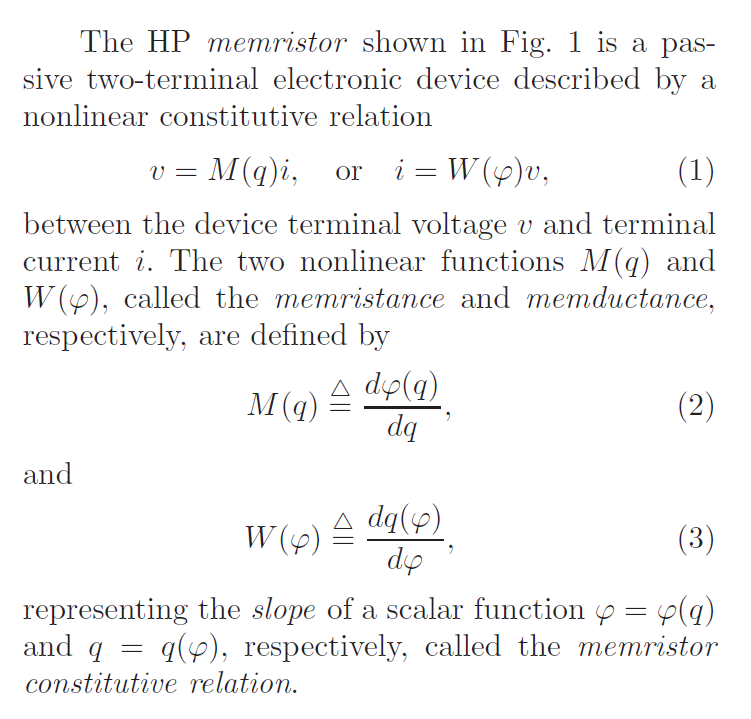

monotone-increasing piecewise-linear memristor:
$$
\begin{align*}
q(\varphi)=b\varphi+0.5(a-b)\Big[|\varphi+1|-|\varphi-1|\Big] \\
\varphi(q)=dq+0.5(c-d)\Big[|q+1|-|q-1|\Big]
\end{align*}
$$
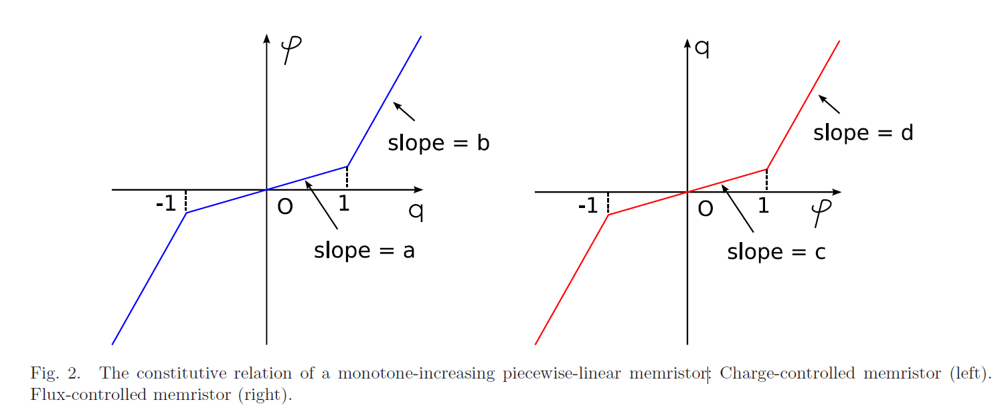

In [3]:
# Memristance M y Memductance W son caracterizadas con la misma funcion pero tener en cuenta que a,b,c,d > 0 son distintos 
def MIPL_Memristor(flux,a,b): 
    return a if np.abs(flux)<1 else b  

MIPL_Memristor = np.vectorize(MIPL_Memristor)

# Buscarino 2018, 2012 - Pham 2012 - Itoh 2008

## La celula

Itoh, Chua 2008 Memristor Oscillators - 4.2. A third-order memristor-based Chua oscillator

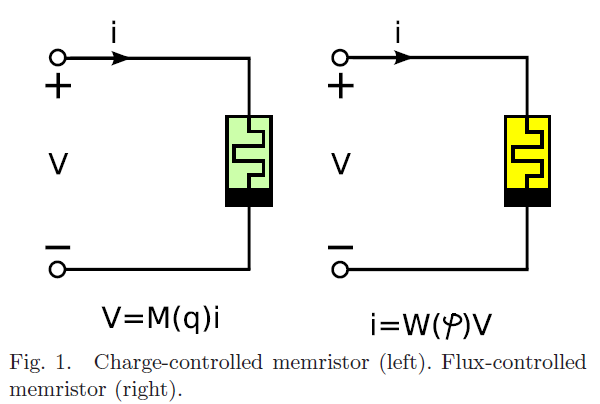 
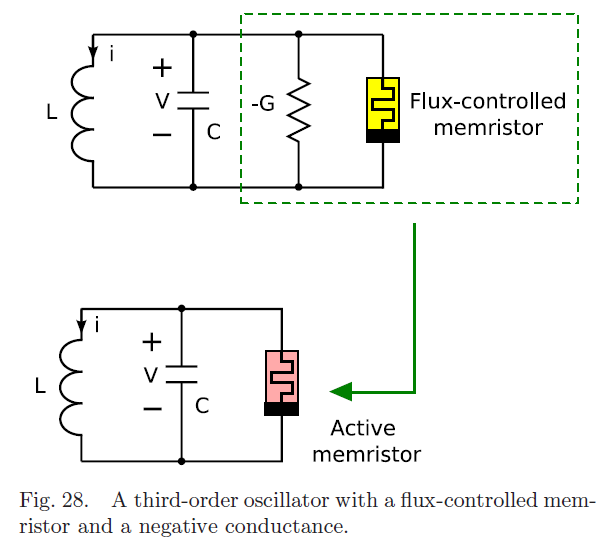


## Sistema Reaccion-Difusion 

Un sistema de reaccion difusion de dos componente que incluya difusion __cruzada__ toma la forma 
$$
\begin{align}
\begin{bmatrix}
   \dot{X} \\
   \dot{Y}
\end{bmatrix}
=
\begin{bmatrix}
   D_{\,1\,1} & D_{\,1\,2} \\
   D_{\,2\,1} & D_{\,2\,2}
\end{bmatrix}
\begin{bmatrix}
   \nabla^2 X \\
   \nabla^2 Y
\end{bmatrix}
+
\begin{bmatrix}
   f(X,Y) \\
   g(X,Y)
\end{bmatrix}
\end{align}
$$
Tomando 
$$
\begin{align}
&f(X,Y) = \alpha\bigg[ - Y - X\cdot W\bigg(\frac{Y+\kappa}{\beta}\bigg) + \gamma X \bigg] \\
&g(X,Y) = \beta X
\end{align}
$$
Obtenemos el sistema de ecuaciones 
$$ 
\begin{align}
&\dot{X} = D_{\,1\,1} \nabla^2 X + D_{\,1\,2} \nabla^2 Y + \alpha\bigg[ - Y - X\cdot W\bigg( \frac{Y+\kappa}{\beta} \bigg) + \gamma X \bigg] \\
&\dot{Y} = D_{\,2\,1} \nabla^2 X + D_{\,2\,2} \nabla^2 Y + \beta X
\end{align}
$$
Empleando diferencias forward en el tiempo con la discretizacion $ t \rightarrow n=1,\dots,K$ y discretizando el espacio $y\rightarrow i=1,\dots,M$ , $x\rightarrow i=1,\dots,N$
$$
\begin{align}
&X^{\,n+1}_{\,i\,,\,j} = X^{\,n}_{\,i\,,\,j} + dt\bigg[ D_{\,1\,1} \nabla^2 X + D_{\,1\,2} \nabla^2 Y\bigg] + \alpha\,dt\bigg[-Y^{\,n}_{\,i\,,\,j} - X^{\,n}_{\,i\,,\,j}\cdot W\bigg(\frac{Y^{\,n}_{\,i\,,\,j}+\kappa}{\beta}\bigg) + \gamma X^{\,n}_{\,i\,,\,j} \bigg] \\
&Y^{\,n+1}_{\,i\,,\,j} = Y^{\,n}_{\,i\,,\,j} + dt\bigg[ D_{\,2\,1} \nabla^2 X + D_{\,2\,2} \nabla^2 Y\bigg] + \beta\,dt\,X^{\,n}_{\,i\,,\,j}
\end{align} 
$$

## Los circuitos

### Memristive Canonical Chua's Oscillator (Ito 2008 - 3.1 fig.7 eq.39) (Buscarino 2012 - 3.1 fig.1 eq.10)

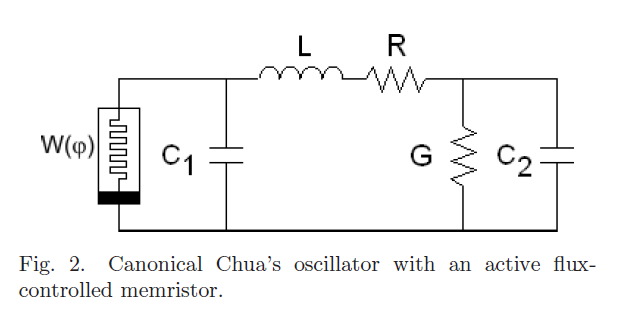
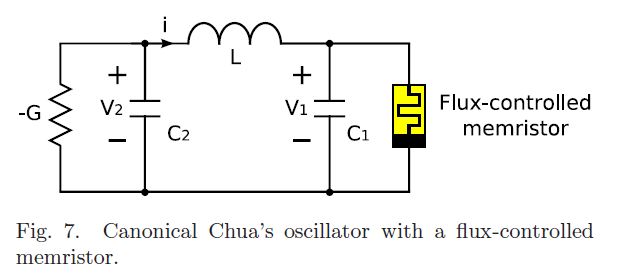

$$
\boxed{
\begin{align*}
&\frac{dX}{dt} = \alpha\bigg[Y - X\cdot W\big(U\big)\bigg] \\ 
&\frac{dY}{dt} = Z-X   \\
&\frac{dZ}{dt} = -\beta Y + \gamma Z \\
&\frac{dU}{dt} = X
\end{align*}}
$$

In [ ]:
def X(t,x,y,z,u,alpha,a,b):
    return alpha*(y-x*MIPL_Memristor(u,a,b))
def Y(t,x,y,z,u):
    return z-x
def Z(t,x,y,z,u,beta,gamma):
    return -beta*y+gamma*z
def U(t,x,y,z,u):
    return x

# Parametros del sistema
alpha = 4
beta = 1
gamma = 0.65
a = 0.2
b = 10
InitCond = (0.25,0,0,0)

# Solucion del sistema de ecuaciones
X1 = lambda t,x,y,z,u: X(t,x,y,z,u,alpha,a,b)
Z1 = lambda t,x,y,z,u: Z(t,x,y,z,u,beta,gamma)
T , x , y , z , u = RK4_4Coupled(X1,Y,Z1,U,0.001,[0,500],InitCond)


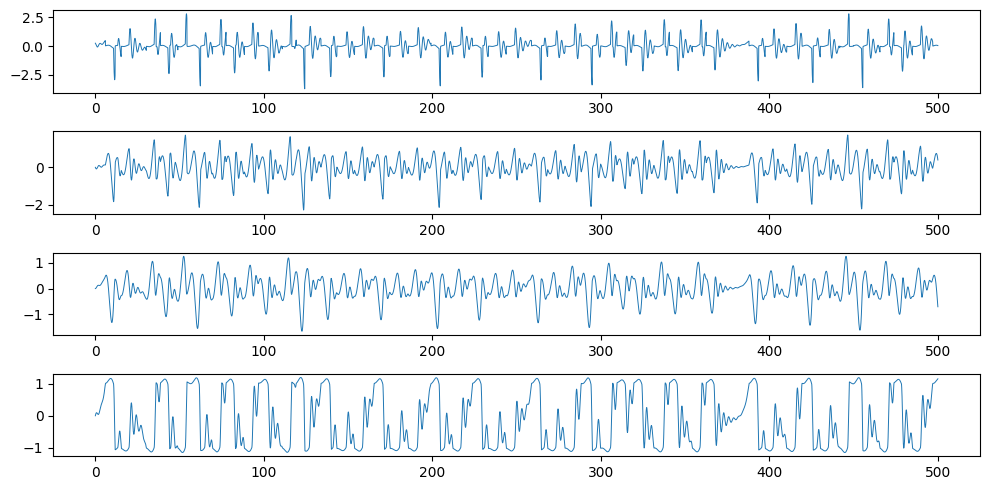

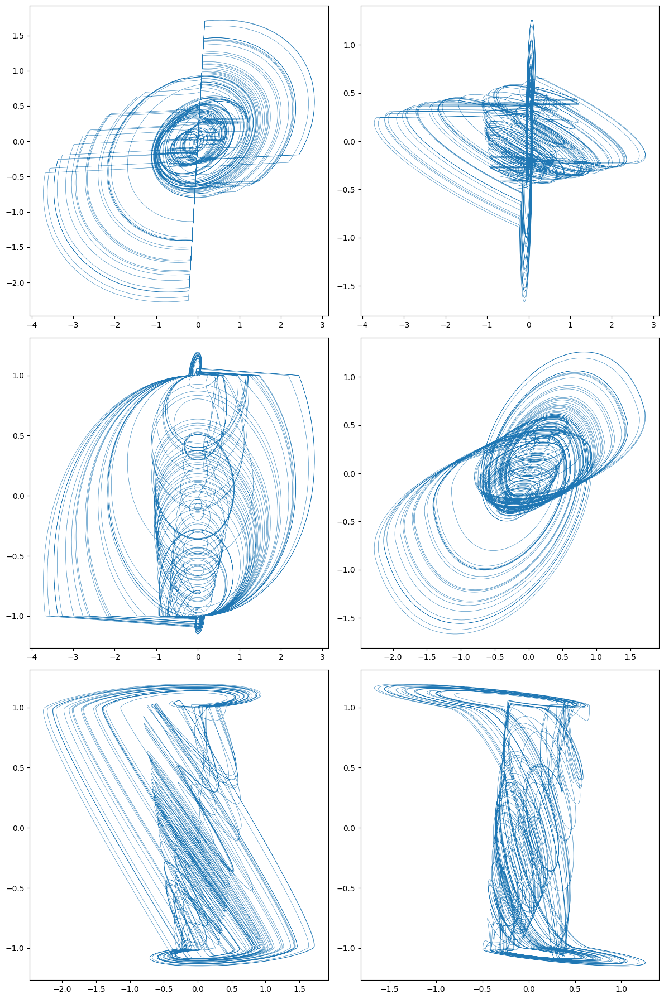

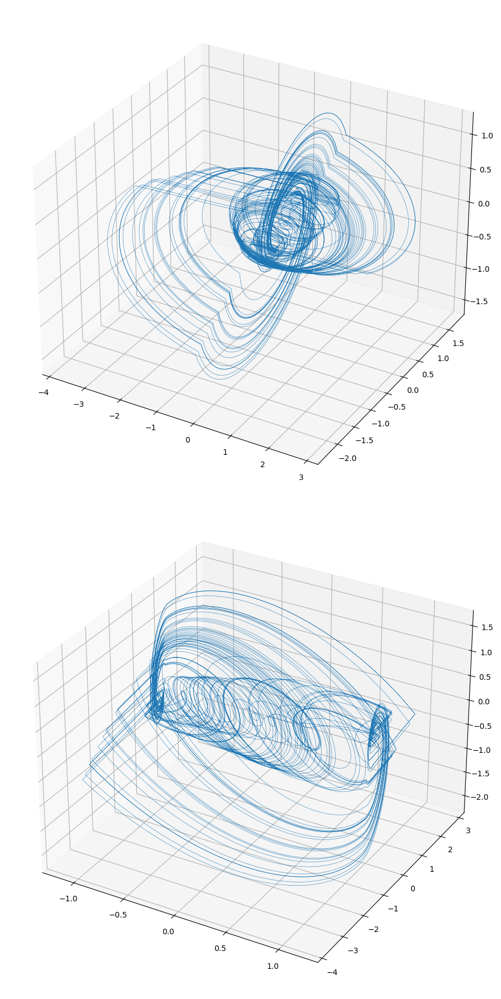

In [37]:
fig , axes = plt.subplots(4,1,figsize=(10,5),layout='tight')
axes[0].plot(T,x,linewidth=0.7)
axes[1].plot(T,y,linewidth=0.7)
axes[2].plot(T,z,linewidth=0.7)
axes[3].plot(T,u,linewidth=0.7)
plt.show()

fig , axes = plt.subplots(3,2,figsize=(12,18),layout='tight')
axes[0][0].plot(x,y,linewidth=0.4)
axes[0][1].plot(x,z,linewidth=0.4)
axes[1][0].plot(x,u,linewidth=0.4)
axes[1][1].plot(y,z,linewidth=0.4)
axes[2][0].plot(y,u,linewidth=0.4)
axes[2][1].plot(z,u,linewidth=0.4)
plt.show()

fig , axes = plt.subplots(2,1,figsize=(12,18),layout='tight',subplot_kw=dict(projection='3d'))
axes[0].plot(x,y,z,linewidth=0.4)
axes[1].plot(u,x,y,linewidth=0.4)

plt.show()

### (Ito 2008 - 3.1 fig.11 eq.50)

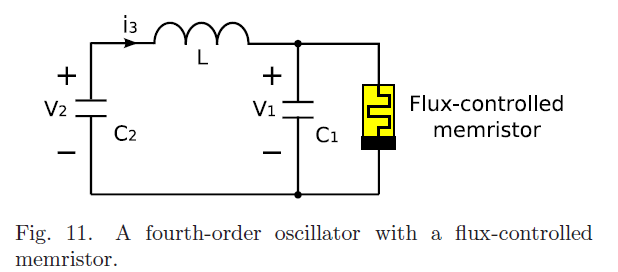

$$
\boxed{
\begin{align*}
&\frac{dX}{dt} = \alpha\bigg[Y - X\cdot W\big(U\big)\bigg] \\ 
&\frac{dY}{dt} = -\xi(X+Z)  \\
&\frac{dZ}{dt} = \beta Y  \\
&\frac{dU}{dt} = X
\end{align*}}
$$

In [32]:
def X(t,x,y,z,u,alpha,a,b):
    return alpha*(y-x*MIPL_Memristor(u,a,b))
def Y(t,x,y,z,u,xi):
    return -xi*(x+z)
def Z(t,x,y,z,u,beta):
    return beta*y
def U(t,x,y,z,u):
    return x

# Parametros del sistema
alpha = 4.2
beta = -20
xi = -1
a = -2
b = 9
InitCond = (0.25,0,0,0)

# Solucion del sistema de ecuaciones
X1 = lambda t,x,y,z,u: X(t,x,y,z,u,alpha,a,b)
Y1 = lambda t,x,y,z,u: Y(t,x,y,z,u,xi)
Z1 = lambda t,x,y,z,u: Z(t,x,y,z,u,beta)
T , x , y , z , u = RK4_4Coupled(X1,Y1,Z1,U,0.0001,[0,250],InitCond)

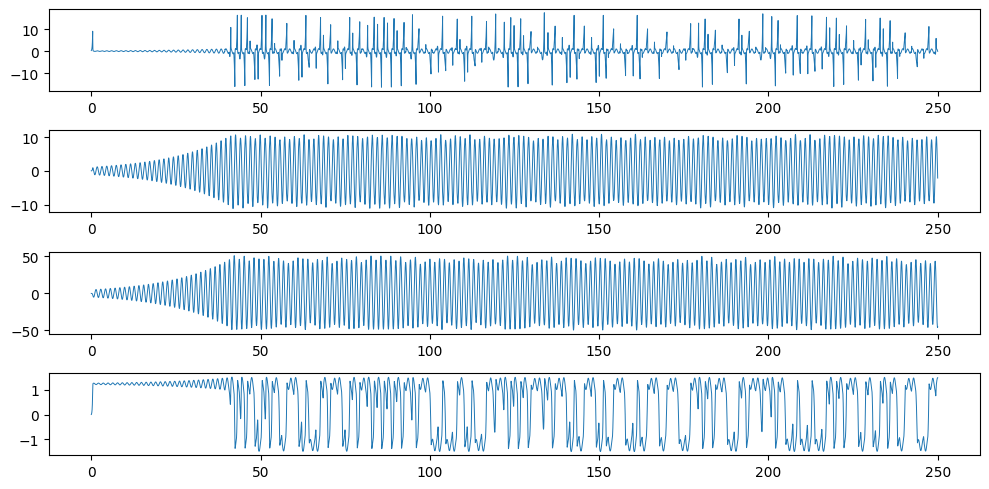

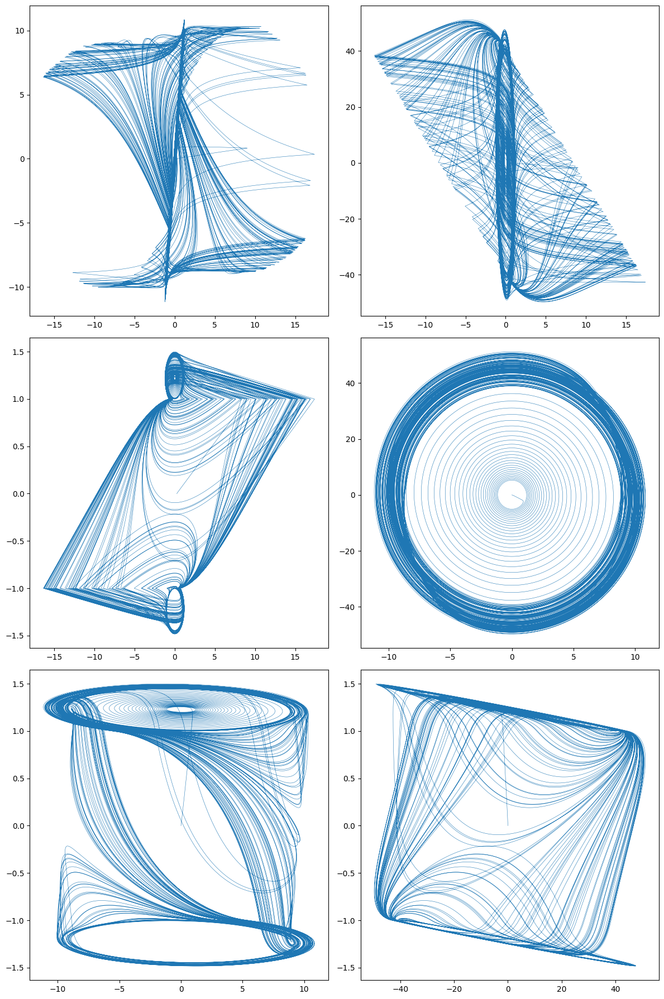

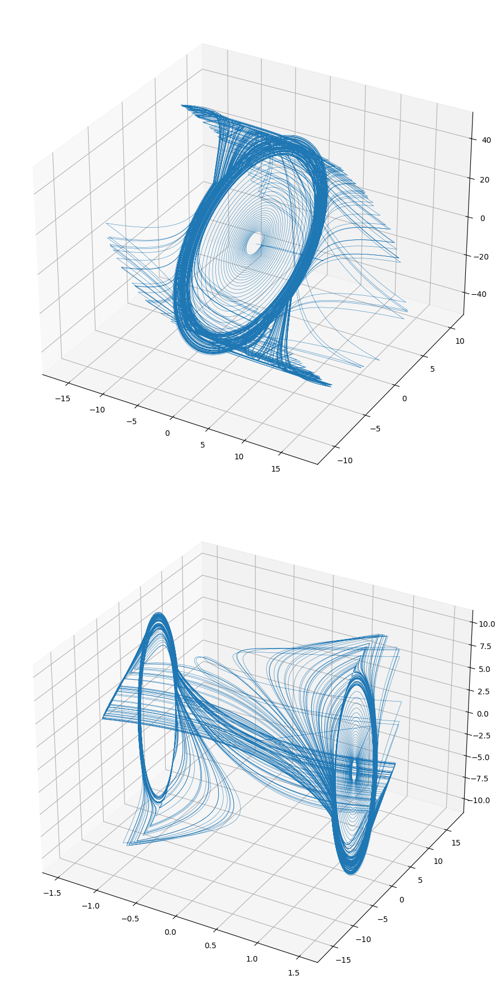

In [33]:
fig , axes = plt.subplots(4,1,figsize=(10,5),layout='tight')
axes[0].plot(T,x,linewidth=0.7)
axes[1].plot(T,y,linewidth=0.7)
axes[2].plot(T,z,linewidth=0.7)
axes[3].plot(T,u,linewidth=0.7)
plt.show()

fig , axes = plt.subplots(3,2,figsize=(12,18),layout='tight')
axes[0][0].plot(x,y,linewidth=0.4)
axes[0][1].plot(x,z,linewidth=0.4)
axes[1][0].plot(x,u,linewidth=0.4)
axes[1][1].plot(y,z,linewidth=0.4)
axes[2][0].plot(y,u,linewidth=0.4)
axes[2][1].plot(z,u,linewidth=0.4)
plt.show()

fig , axes = plt.subplots(2,1,figsize=(12,18),layout='tight',subplot_kw=dict(projection='3d'))
axes[0].plot(x,y,z,linewidth=0.4)
axes[1].plot(u,x,y,linewidth=0.4)

plt.show()

### Memristive Chua's Oscillator (Ito 2008 - 4.1 fig.5 eq.98) (Buscarino 2012 - 3.2 fig.5 eq.14)

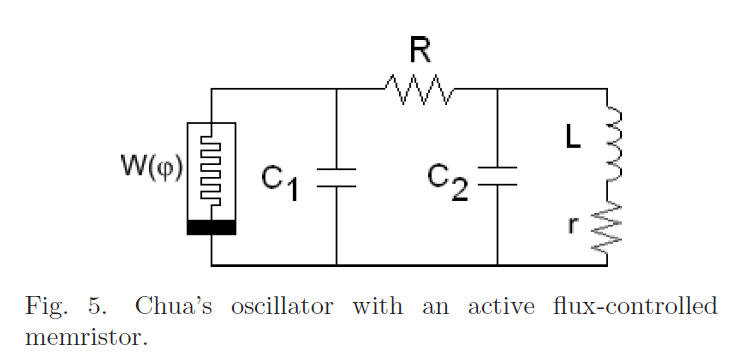
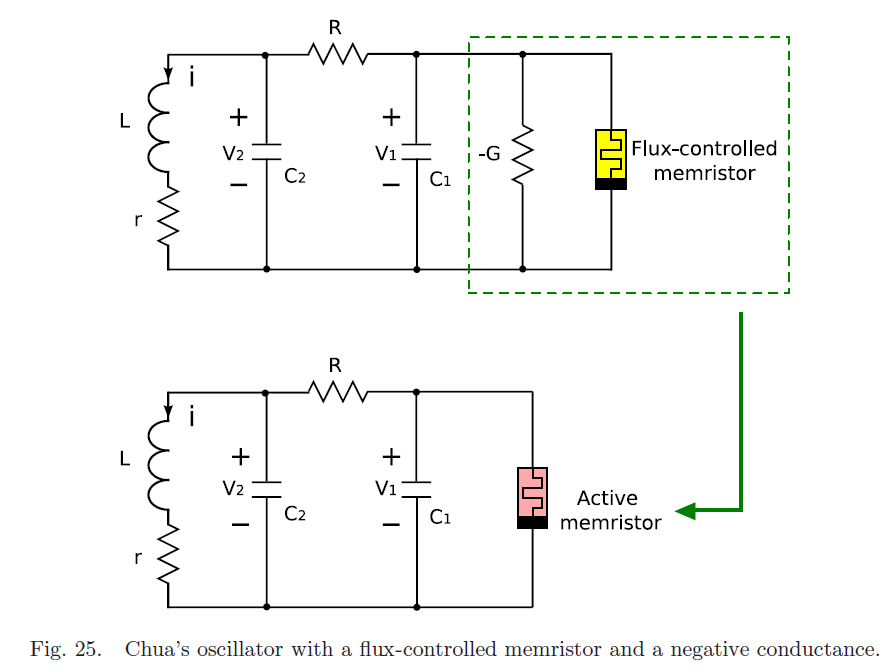

$$
\boxed{
\begin{align*}
&\frac{dX}{dt} = \alpha\bigg[Y - X+\xi X -X\cdot W\big(U\big)\bigg] \\ 
&\frac{dY}{dt} = X-Y+Z  \\
&\frac{dZ}{dt} = -\beta Y -\gamma Z \\
&\frac{dU}{dt} = X
\end{align*}}
$$

In [36]:
def X(t,x,y,z,u,alpha,xi,a,b):
    return alpha*(y - x + xi*x -x*MIPL_Memristor(u,a,b))
def Y(t,x,y,z,u):
    return x-y+z
def Z(t,x,y,z,u,beta,gamma):
    return -beta*y -gamma*z
def U(t,x,y,z,u):
    return x

# Parametros del sistema
alpha = 10
beta = 13
gamma = 0.35
xi = 1.5
a = 0.3
b = 0.8
InitCond = (0.25,0,0,0)

# Solucion del sistema de ecuaciones
X1 = lambda t,x,y,z,u: X(t,x,y,z,u,alpha,xi,a,b)
Z1 = lambda t,x,y,z,u: Z(t,x,y,z,u,beta,gamma)
T , x , y , z , u = RK4_4Coupled(X1,Y,Z1,U,0.001,[0,500],InitCond)

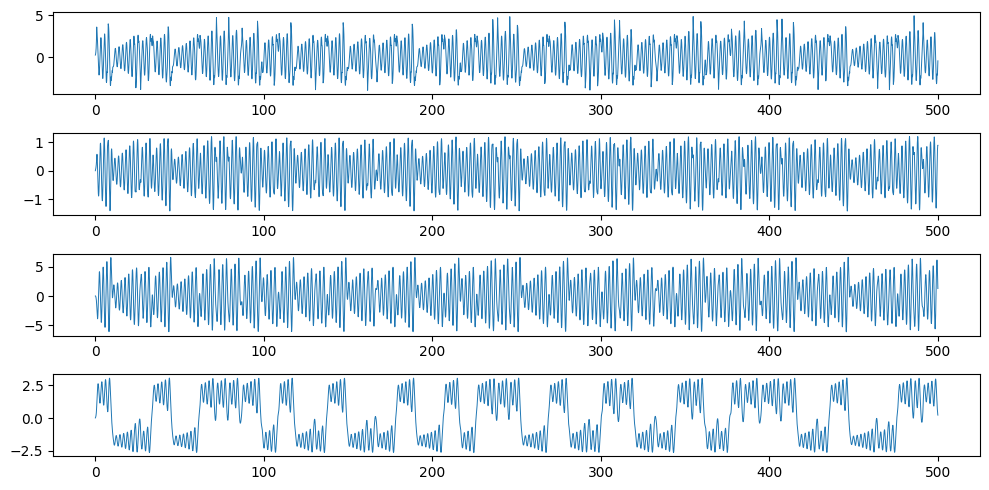

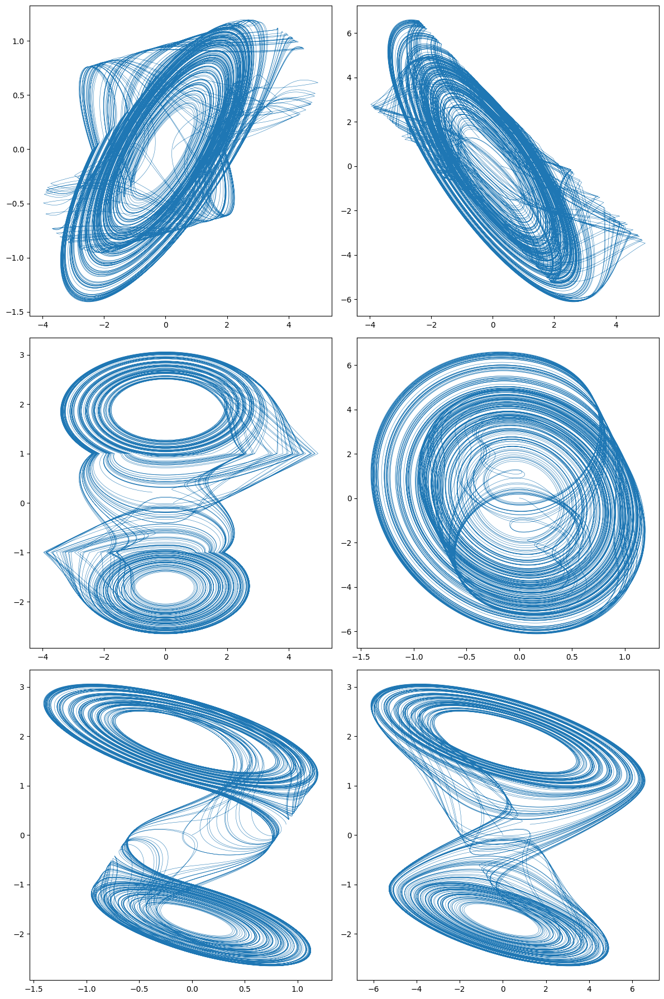

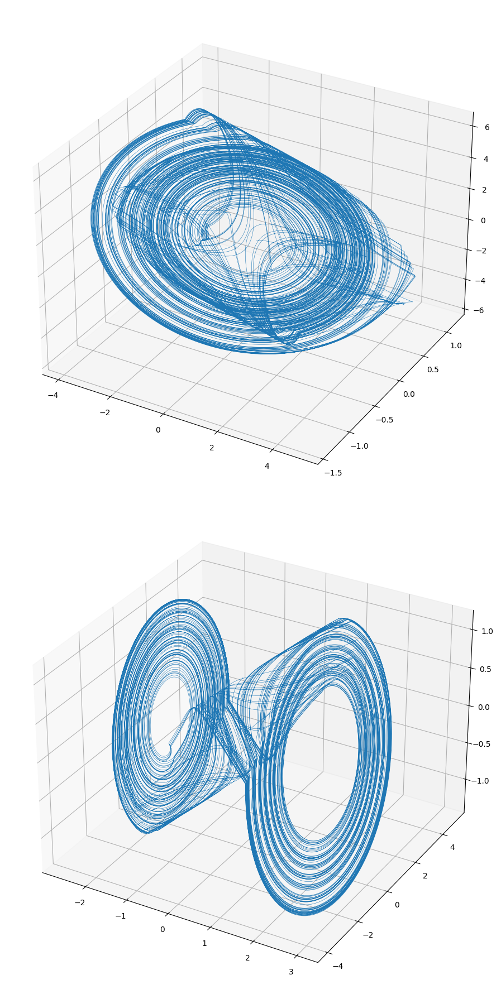

In [37]:
fig , axes = plt.subplots(4,1,figsize=(10,5),layout='tight')
axes[0].plot(T,x,linewidth=0.7)
axes[1].plot(T,y,linewidth=0.7)
axes[2].plot(T,z,linewidth=0.7)
axes[3].plot(T,u,linewidth=0.7)
plt.show()

fig , axes = plt.subplots(3,2,figsize=(12,18),layout='tight')
axes[0][0].plot(x,y,linewidth=0.4)
axes[0][1].plot(x,z,linewidth=0.4)
axes[1][0].plot(x,u,linewidth=0.4)
axes[1][1].plot(y,z,linewidth=0.4)
axes[2][0].plot(y,u,linewidth=0.4)
axes[2][1].plot(z,u,linewidth=0.4)
plt.show()

fig , axes = plt.subplots(2,1,figsize=(12,18),layout='tight',subplot_kw=dict(projection='3d'))
axes[0].plot(x,y,z,linewidth=0.4)
axes[1].plot(u,x,y,linewidth=0.4)

plt.show()